In [1]:
%load_ext autoreload
%autoreload 2

import jax
from quicknav_jax import (
  RoomParams,
  generate_rooms,
  NavigationEnvParams,
  NavigationEnv
)

ROOM_SEED = 42

# Generate rooms
room_key = jax.random.PRNGKey(ROOM_SEED)
room_params = RoomParams(size=8.0, grid_size=16)
obstacles, free_positions = generate_rooms(room_key, room_params)

# Initialize environment parameters with generated rooms
env_params = {
  "rooms": room_params,
  "obstacles": obstacles,
  "free_positions": free_positions,
  "lidar_fov": 90
}

config = {
  "env": NavigationEnv(),
  "total_timesteps": 2_000_000,
  "normalize_observations": True,
  "num_steps": 128,
  "num_minibatches": 32,
  "num_envs": 512,
}

In [2]:
from models.critic import Critic
from criteria.ppo import PPO
from criteria.gaussian_policy import GaussianPolicy
import numpy as np


create_actor = lambda model:  GaussianPolicy(2, (np.array([-1., -1.]), np.array([1., 1.])), model)

In [3]:
from models.gtrxl import GTrXL


head_dim: int = 8
embedding_dim: int = 16
head_num: int = 2
mlp_num: int = 2
layer_num: int = 3
memory_len: int = 32

# Initialize the training algorithm parameters
grtxl_config = {
    # Pass our environment to the agent
    "env_params": NavigationEnvParams(
      memory_init=lambda: GTrXL.init_memory(memory_len, embedding_dim, layer_num),
      **env_params,
    ),
    **config,
}

# Create the training algorithm agent from `rejax` library
grtxl_agent = PPO.create(**grtxl_config)
grtxl_agent = grtxl_agent.replace(
  actor=create_actor(GTrXL(head_dim, embedding_dim, head_num, mlp_num, layer_num, memory_len)),
  critic=Critic(GTrXL(head_dim, embedding_dim, head_num, mlp_num, layer_num, memory_len))
)

In [4]:
import jax
import time

# Set the seed for reproducibility
TRAIN_SEED = 43

# Set training seed and jit train function
rng = jax.random.PRNGKey(TRAIN_SEED)
grtxl_train_fn = jax.jit(grtxl_agent.train)

print("Starting to train")

# Train!
start: float = time.time()
grtxl_train_state, grtxl_train_evaluation = grtxl_train_fn(rng)
time_elapsed = time.time() - start

sps = grtxl_agent.total_timesteps / time_elapsed
print(f"Finished training in {time_elapsed:g} seconds ({sps:g} steps/second).")

Starting to train
Finished training in 534.124 seconds (3744.45 steps/second).


PPOState(rng=Array([1667711428, 3090707323], dtype=uint32), env_state=EnvState(x=Array([4.582216  , 5.1710467 , 3.8135357 , 5.558186  , 4.0373325 ,
       5.251453  , 4.080251  , 4.437294  , 4.6839495 , 3.9636345 ,
       6.364116  , 6.474276  , 5.5198274 , 2.7750764 , 4.93312   ,
       1.2161355 , 2.1645224 , 5.6286035 , 3.7522256 , 4.713483  ,
       3.7953472 , 4.080783  , 4.268426  , 4.137289  , 2.9223518 ,
       1.4482703 , 4.5870085 , 0.81524825, 2.397947  , 4.5051975 ,
       6.1058702 , 3.5422888 , 3.4783535 , 2.5042229 , 2.754237  ,
       4.7118893 , 3.25      , 4.5922675 , 4.0363965 , 6.160886  ,
       6.034271  , 2.756142  , 3.1474645 , 3.64826   , 3.459973  ,
       4.22326   , 6.7240586 , 4.7799973 , 2.2279053 , 6.340763  ,
       5.0036254 , 2.7400315 , 5.4913783 , 4.744071  , 4.8823175 ,
       2.9758132 , 3.9437308 , 4.4892206 , 6.7185907 , 4.435489  ,
       5.4965224 , 4.897957  , 3.8687396 , 5.275451  , 1.869051  ,
       4.420756  , 3.7586825 , 4.8374405 , 2.781

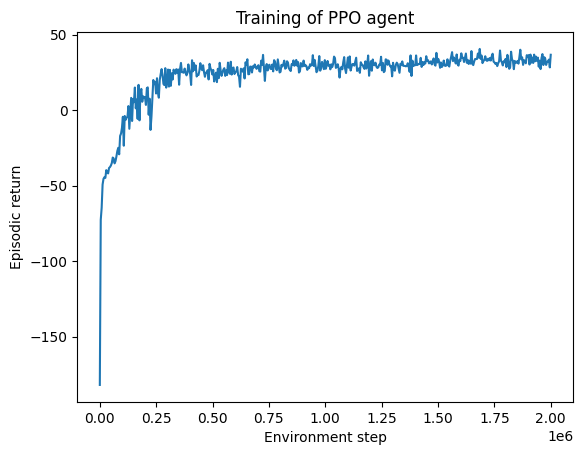

In [5]:
from matplotlib import pyplot as plt
import os


print(grtxl_train_state)

episode_lengths, episode_returns = grtxl_train_evaluation
mean_return = episode_returns.mean(axis=1)

plt.plot(jax.numpy.linspace(0, grtxl_agent.total_timesteps, len(mean_return)), mean_return)
plt.xlabel("Environment step")
plt.ylabel("Episodic return")
plt.title(f"Training of {grtxl_agent.__class__.__name__} agent")
plt.show()

# Create temp directory if it doesn't exist
os.makedirs("temp", exist_ok=True)

# Save the training curve data as numpy array for comparison with other algorithms
np.save(f"temp/{grtxl_agent.__class__.__name__}_training_curve.npy", mean_return)


In [6]:
from quicknav_jax import evaluate_model

# Set the seed for reproducibility
TEST_SEED = 77

evaluation = evaluate_model(
    agent=grtxl_agent,
    train_state=grtxl_train_state,
    seed=TEST_SEED,
    render=True,
    n_eval_episodes=10,
)

# Save the returns for comparison with other algorithms
np.save(f"temp/{grtxl_agent.__class__.__name__}_returns.npy", evaluation.returns)

Evaluation finished, mean return: 36.151580810546875


GIF saved to temp/PPO_policy.gif


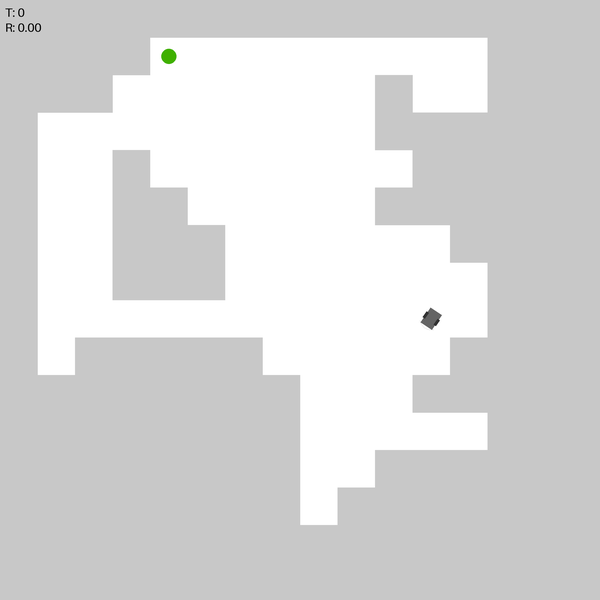

In [7]:
from quicknav_utils.env_vis import save_gif
from pathlib import Path
from IPython.display import Image as IPImage, display

if evaluation.rendered_frames is not None:
    path = Path(f"temp/{grtxl_agent.__class__.__name__}_policy.gif")
    save_gif(evaluation.rendered_frames, path)

    display(IPImage(filename=path))

    # Save the rendered frames as numpy array for comparison with other algorithms
    np.save(
        f"temp/{grtxl_agent.__class__.__name__}_rendered_frames.npy",
        np.array(evaluation.rendered_frames, dtype=object),
        allow_pickle=True,
    )